# IBM Data Science Capstone Project

This notebook will be mainly used for the capstone project which aims to build a predictive model for a real problem, as described in the README file.

## Table of Contents
### [1. Business Problem](#business)
### [2. Data](#data)
### [3. Methodology](#methodology)
#### [3.1. Data Import](#data_import)
#### [3.2 Data Cleaning and Exploration](#data_clean)
#### [3.3 Models](#model)
### [4. Results](#results)
### [5. Discussion](#discussion)
### [6. Conclusion](#conclusion)

## Business Problem <a name="business"></a>

Waze is one of the most popular GPS app providing turn-by-turn navigation information based on optimized routes as well as ATA, speed cameras, and traffic police radars. It became a huge success based on its community-driven navigation aspect, where users are rewarded and ranked by helping each other, registering traffic occurrences in real-time such as police, traffic jams, and accidents.

But what if we could do better than rely on users to add the information of this accidents after they occur and instead we could warn users, given the weather, the road conditions, and many possible variables, about the possibility of them getting into a car accident and how severe it would be so that they would drive more carefully or even change there travel if they are able to. Wouldn't that be great?

Not only the users would benefit from this directly by having access 24/7 to this information but traffic police could allocate its resources to better monitor risky areas, which would decrease incidents leading people to the hospital which in turn would reduce the amount of money spent on public health that could be invested in other areas that have a budget deficiency, therefore improving all the city environment.

## Data <a name="data"></a>

The data (downloaded from the [Seattle GeoData website](https://data-seattlecitygis.opendata.arcgis.com/datasets/5b5c745e0f1f48e7a53acec63a0022ab_0)), weekly recorded by Traffic Records and provided by the Seattle Police Department, contains around 40 variables from a total of 221.525 accidents that occurred between 01/01/2004 and 20/05/2020. The dataset has a lot of cleaning to do, given the high amount of missing information, a total of 1.100.024 fields across the entire dataset. Apart from that, the dependent variable SEVERITY is unbalanced, for instance, the "Property Damage Only Collision" class is twice as many as the "Injury Collision", the second most frequent class, as the former has 137.671 observation and the latter has only 58.783.
 
Some of these variables will definitely be excluded as almost all rows are blank, as others will be removed because are redundant, such as coded variables that already have its description in another column, eg.: SDOT_COLCODE and SDOT_COLDESC. Given the probable usage for the final machine learning model, some variables will be kept regardless of the missing information but probably the rows will either be removed or estimated, for example using the column mean, when dealing with numerical attributes, or the column mode, for categorical ones.  

## Methodology <a name="methodology"></a>

### Data Import <a name="data_import"></a>

First and foremost we need to import all the needed packages and the dataset to work on.

In [1]:
import gc
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pydotplus
import folium
from folium.plugins import HeatMap
from sklearn import preprocessing, tree, svm
from sklearn.tree import plot_tree
from sklearn.utils import resample
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from xgboost import XGBClassifier

In [2]:
def plot_feat_imp(importances, X):   
    # Sort feature importances in descending order
    indices = np.argsort(importances)[::-1]

    # Rearrange feature names so they match the sorted feature importances
    names = [df_dummies.columns.values[i] for i in indices]

    plt.figure(figsize=(25,10))

    # Create plot title
    plt.title("Feature Importance")

    # Add bars
    plt.bar(range(X.shape[1]), importances[indices])

    # Add feature names as x-axis labels
    plt.xticks(range(X.shape[1]), names, rotation=90)

    # Show plot
    plt.show()

In [3]:
data = pd.read_csv(filepath_or_buffer="~/Downloads/Collisions.csv", index_col="INCKEY")

data.shape

/home/user/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (35) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


(221525, 39)

In [64]:
data.head(3)

,X,Y,OBJECTID,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,LOCATION,EXCEPTRSNCODE,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
INCKEY,,,,,,,,,,,,,,,,,,,,,
1003,-122.344896,47.717173,1,1003,3503158,Matched,Block,NaN,AURORA AVE N BETWEEN N 117TH PL AND N 125TH ST,,...,Dry,Daylight,Y,NaN,NaN,45,Vehicle - Pedalcyclist,15057,0,N
56200,-122.376467,47.543774,2,56200,1795087,Matched,Block,NaN,35TH AVE SW BETWEEN SW MORGAN ST AND SW HOLLY ST,NaN,...,Dry,Dark - Street Lights On,NaN,6015003.0,NaN,0,Vehicle going straight hits pedestrian,0,0,N
327037,-122.360735,47.701487,3,328537,E979380,Matched,Intersection,37122.0,3RD AVE NW AND NW 100TH ST,,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N


To facilitate writing code functions using the columns name, I usually prefer to rename columns and put then in lower case separating words with an underscore so that I don't have to keep changing the capslock option and put everything between quotes.

In [4]:
data.columns = data.columns.str.lower()
data.columns

Index(['x', 'y', 'objectid', 'coldetkey', 'reportno', 'status', 'addrtype',
       'intkey', 'location', 'exceptrsncode', 'exceptrsndesc', 'severitycode',
       'severitydesc', 'collisiontype', 'personcount', 'pedcount',
       'pedcylcount', 'vehcount', 'injuries', 'seriousinjuries', 'fatalities',
       'incdate', 'incdttm', 'junctiontype', 'sdot_colcode', 'sdot_coldesc',
       'inattentionind', 'underinfl', 'weather', 'roadcond', 'lightcond',
       'pedrownotgrnt', 'sdotcolnum', 'speeding', 'st_colcode', 'st_coldesc',
       'seglanekey', 'crosswalkkey', 'hitparkedcar'],
      dtype='object')

### Data Cleaning and Exploration <a name="data_clean"></a>
#### Categorical Variables

As stated before the that has some missing issues and label adjustments that need to be corrected. In the cell below I count the number of missing rows for each column to identify which ones I will have to remove as a whole and which ones I can just remove some observations.

As the purpose of this script is to make a predictive model that determines the severity of the traffic accident based on its conditions, some variables such *coldetkey*, *reportno*, *status*, and *location* doesn't make sense to be used from the business perspective and therefore they will also be removed

In [5]:
count_null = data.isnull().sum().sort_values(ascending = False)
count_null

pedrownotgrnt      216330
speeding           211596
exceptrsndesc      209746
inattentionind     191337
intkey             149589
exceptrsncode      120403
sdotcolnum          94320
lightcond           26592
weather             26503
roadcond            26422
collisiontype       26313
st_coldesc          26313
underinfl           26293
junctiontype        11974
st_colcode           9413
x                    7475
y                    7475
location             4590
addrtype             3712
sdot_colcode            1
severitycode            1
sdot_coldesc            1
objectid                0
coldetkey               0
reportno                0
status                  0
hitparkedcar            0
severitydesc            0
personcount             0
pedcount                0
pedcylcount             0
vehcount                0
injuries                0
crosswalkkey            0
fatalities              0
incdate                 0
incdttm                 0
seglanekey              0
seriousinjur

In [6]:
non_usable_cols = count_null[count_null > 30000].index.tolist()
non_usable_cols.extend(("coldetkey", "reportno", "location", "status"))

data.drop(non_usable_cols, axis = 1, inplace = True)
data.dtypes

x                  float64
y                  float64
objectid             int64
addrtype            object
severitycode        object
severitydesc        object
collisiontype       object
personcount          int64
pedcount             int64
pedcylcount          int64
vehcount             int64
injuries             int64
seriousinjuries      int64
fatalities           int64
incdate             object
incdttm             object
junctiontype        object
sdot_colcode       float64
sdot_coldesc        object
underinfl           object
weather             object
roadcond            object
lightcond           object
st_colcode          object
st_coldesc          object
seglanekey           int64
crosswalkkey         int64
hitparkedcar        object
dtype: object

Without a model, users could already benefit from this data since its possible to see which Seattle regions have more accidents and avoid them if possible.

In [7]:
# define the world map centered around Seattle with a low zoom level
world_map = folium.Map(location=[47.6129432, -122.4821475], zoom_start=10, tiles='cartodbdark_matter')

HeatMap(\
        list(zip(\
                 data[~data.x.isnull()].y.to_list(),\
                 data[~data.x.isnull()].x.to_list()\
                )),\
        radius = 9)\
    .add_to(world_map)

world_map

Not all variables were correctly interpreted by the language, such as dates, and, in order to optimize operations performance such as filters and aggregation, and also to plot some specific graphics, this variables must be cast to the proper date type 

In [7]:
data.incdate = pd.to_datetime(data.incdate).dt.date
data.incdttm = pd.to_datetime(data.incdttm)

As mentioned in the data session, the dependent variable is highly unbalanced, in order to correct this problem to some degree I will transform this multiclass problem into a binary problem by transforming these groups in the away that my dependent variable will be accidents with ou without injuries. Also, at this point, I can remove the _x_ and _y_ variables as they were already used to plot the heatmap and don't make sense to use them in a model.

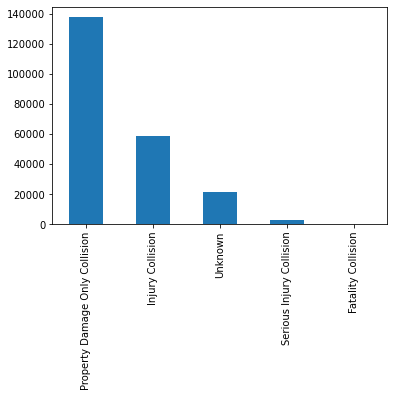

In [9]:
data.severitydesc.value_counts().plot(kind = "bar")

In [8]:
data = data[data.severitycode != "0"]
data['label'] = np.where(data['severitycode'].values == "1", "No Injury", "Injury")

data.drop(['severitycode', 'severitydesc', 'x', 'y', 'objectid'], axis = 1, inplace = True)

data.head(3)

,addrtype,collisiontype,personcount,pedcount,pedcylcount,vehcount,injuries,seriousinjuries,fatalities,incdate,...,underinfl,weather,roadcond,lightcond,st_colcode,st_coldesc,seglanekey,crosswalkkey,hitparkedcar,label
INCKEY,,,,,,,,,,,,,,,,,,,,,
1003,Block,Cycles,2,0,1,1,1,0,0,2013-03-14,...,N,Clear,Dry,Daylight,45,Vehicle - Pedalcyclist,15057,0,N,Injury
56200,Block,Pedestrian,7,1,0,1,1,0,0,2006-01-15,...,0,Overcast,Dry,Dark - Street Lights On,0,Vehicle going straight hits pedestrian,0,0,N,Injury
327037,Intersection,Angles,2,0,0,2,0,0,0,2019-09-09,...,N,Overcast,Wet,Daylight,10,Entering at angle,0,0,N,No Injury


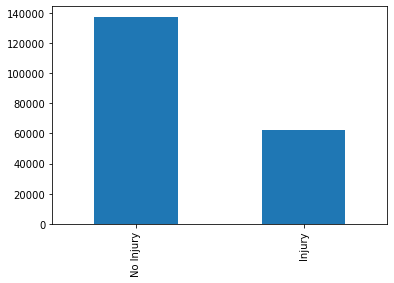

In [11]:
data.label.value_counts().plot(kind = "bar")

Usually, in this type of problem, we can see some patterns across the historical data. As we plot the accidents by day, it's possible to visualize some seasonality, but it should be easier to identify them if we group the information by month. 

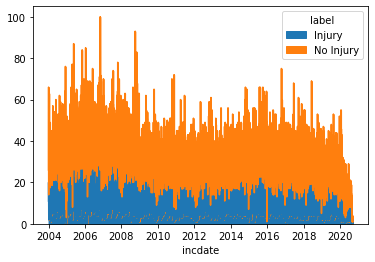

In [12]:
data.groupby(["incdate","label"], as_index = False).size().unstack('label', fill_value=0).plot(kind = "area")

This change makes the patter much clearer so we can have three insights. 

The first one is that the total amount of accidents is reducing consistently since 2015. 

The second is that some months recurrently have a peak in the number of accidents. These peaks may be due holidays and commemorative dates such as the fourth of July, Christmas, new years, and so one, as people tend to drink more and may drive under the influence of alcohol or drugs. Considering this effect, a new variable, called month, will be created and presented to the model.

The last is that 2020 was marked by a pandemic that forced people to stay at home, which has a direct positive effect on traffic accidents since there are fewer drives on the streets. Because of this effect, the 2020 data will be removed from the dataset.

Once all variables regarding the dates are created this column will also be removed since we will not make a time series forecast

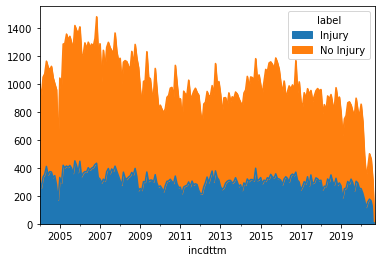

In [13]:
data\
    .groupby(["label", data.incdttm.dt.to_period("M")])\
    .size()\
    .unstack('label', fill_value=0)\
    .plot(kind = "area")   
#.loc['2015-01':'2020-09']\
    

In [9]:
df = data[data['incdate'] < pd.to_datetime('2020-01-01')]
df['month'] = df.incdttm.dt.month.astype(str)

df['hour'] = df.incdttm.dt.hour
df['period'] = "evening"
df.loc[df.hour.between(0, 5), 'period'] = "dawn"
df.loc[df.hour.between(6, 11), 'period'] = "morning"
df.loc[df.hour.between(12, 17), 'period'] = "afternoon"

df.drop(['incdate','incdttm'], axis = 1, inplace = True)

<ipython-input-9-5a987b031c73>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'] = df.incdttm.dt.month.astype(str)
<ipython-input-9-5a987b031c73>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour'] = df.incdttm.dt.hour
<ipython-input-9-5a987b031c73>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gui

After those minor procedures, I've decided to recount the missing rows to understand which variable has the most missing and try removing those rows and recount the null values to understand if they were completely removed from all other variables and if not repeat the process until I have no missing observations.

One thing to bear in mind is the relationship between code and description that should be the same representation, but we can see that the **st_coldesc** has a lot more missing values than its respective code **st_colcode** so this will be treated as well.

In [71]:
df.isnull().sum().sort_values(ascending = False)

junctiontype       6333
lightcond          4214
weather            4119
roadcond           4049
st_coldesc         3942
collisiontype      3942
underinfl          3921
addrtype           1926
st_colcode           19
seriousinjuries       0
month                 0
personcount           0
pedcount              0
pedcylcount           0
vehcount              0
injuries              0
fatalities            0
seglanekey            0
label                 0
sdot_colcode          0
sdot_coldesc          0
hour                  0
hitparkedcar          0
crosswalkkey          0
period                0
dtype: int64

In [10]:
st_codes = df[['st_colcode','st_coldesc']].dropna().drop_duplicates()

df = pd.merge(df, st_codes, how = 'left', on = 'st_colcode')
df.drop(['st_colcode','st_coldesc_x'], axis = 1, inplace = True)
df.dropna(inplace = True)

Just to understand the levels of the categorical variable I'm going to count the values to see the distribution, that is, how many levels there are in each variable if there are unknown observations if the variables are too sparse and can be grouped as an **other** class. For instance **junctiontype** has unknown observations that will be removed; the **sdot_coldesc** has too many levels that may be totally correlated with the dependent variable, so it would be unfair to use it in the mode as it is a post-event observation; **underinfl** need fixing given the duplicated labels for the same meaning *1* and *Y* for *Yes* also *0* and *N* for *No*. **st_coldesc** has many levels with just a few observations so it will be regrouped.

In [17]:
for col in df.select_dtypes(include = 'object').columns.values:
    print(col,":\n", df[col].value_counts(), "\n")

addrtype :
 Block           120283
Intersection     64436
Alley              239
Name: addrtype, dtype: int64 

collisiontype :
 Parked Car    43022
Angles        34610
Rear Ended    33689
Other         23381
Sideswipe     18231
Left Turn     13827
Pedestrian     7408
Cycles         5762
Right Turn     2931
Head On        2097
Name: collisiontype, dtype: int64 

junctiontype :
 Mid-Block (not related to intersection)              87310
At Intersection (intersection related)               62317
Mid-Block (but intersection related)                 22481
Driveway Junction                                    10600
At Intersection (but not related to intersection)     2080
Ramp Junction                                          165
Unknown                                                  5
Name: junctiontype, dtype: int64 

sdot_coldesc :
 MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END AT ANGLE          83403
MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END                    52518
MOTOR VEHICLE S

In [11]:
df = df[df.junctiontype != "Unknown"]
df.loc[df['underinfl'].values == "0", 'underinfl'] = "N"
df.loc[df['underinfl'].values == "1", 'underinfl'] = "Y"
df.loc[df.st_coldesc_y.isin(\
                        df.st_coldesc_y.value_counts().where(lambda x : x<1000).dropna().index.to_list()\
                       ), 'st_coldesc_y'] = 'other'

In [76]:
df.groupby(['label'])['weather'].value_counts(normalize=True)

label      weather                 
Injury     Clear                       0.631448
           Raining                     0.193870
           Overcast                    0.152166
           Unknown                     0.013610
           Fog/Smog/Smoke              0.003226
           Snowing                     0.002907
           Other                       0.001949
           Sleet/Hail/Freezing Rain    0.000470
           Blowing Sand/Dirt           0.000218
           Severe Crosswind            0.000134
No Injury  Clear                       0.582793
           Raining                     0.170059
           Overcast                    0.146023
           Unknown                     0.086624
           Snowing                     0.005556
           Other                       0.004911
           Fog/Smog/Smoke              0.002950
           Sleet/Hail/Freezing Rain    0.000654
           Blowing Sand/Dirt           0.000287
           Severe Crosswind            0.000143
Name

One would imagine that weather conditions and time of the day could imply in more severe accidents, meaning more cases of injuries, but the images below instead show that the location type, such as intersections, and the collision type are some attributes that expose a huge difference among the ratio between accidents with and without an injure. 

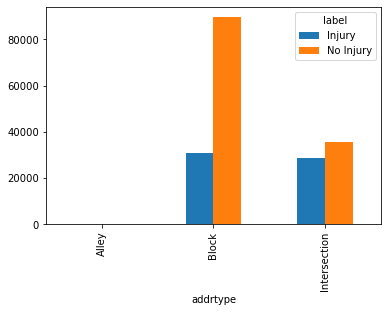

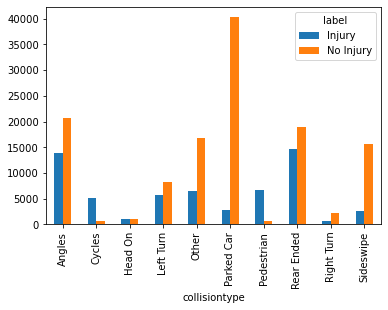

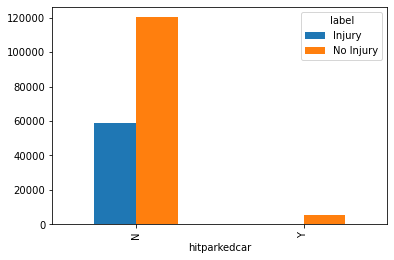

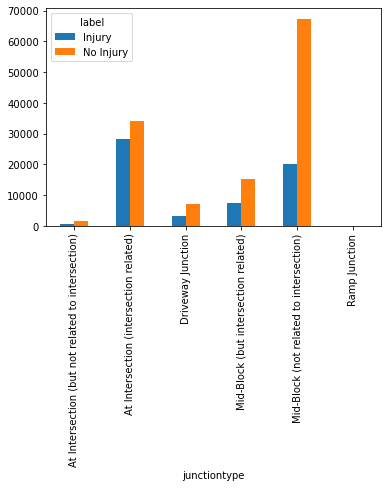

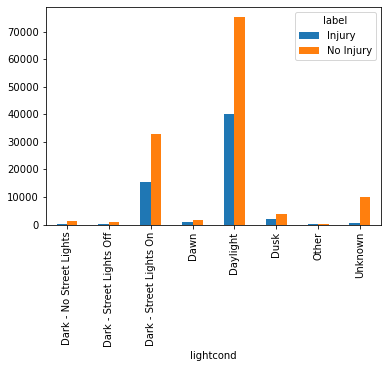

...

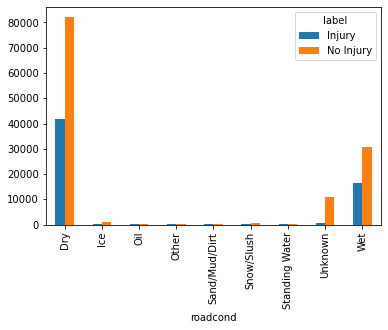

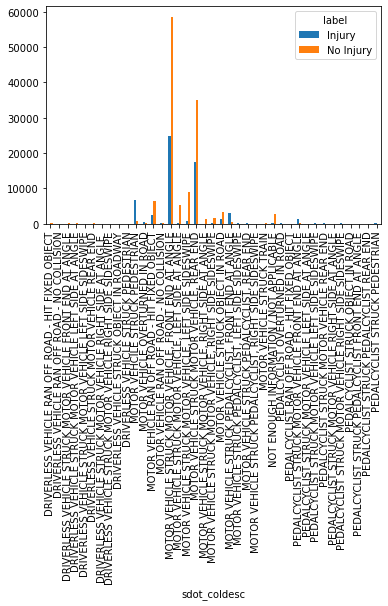

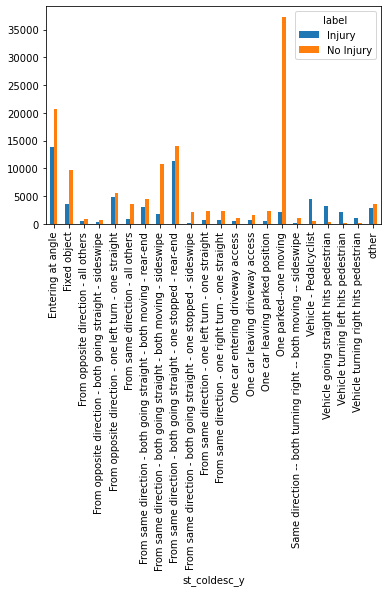

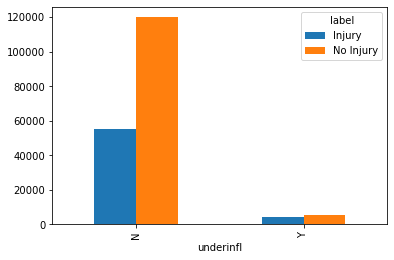

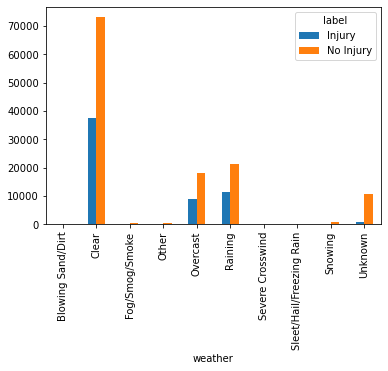

In [20]:
for col in np.setdiff1d(df.select_dtypes(include = 'object').columns.values, ["label"]):
    df.groupby(["label", col])\
        .size()\
        .unstack('label', fill_value=0)\
        .plot(kind = "bar")

#### Numerical variable explore and correlation analyses

As we look at the numerical variables the first thing we see is that some codes are representing categorical variables. The **sdot_colcode** and **hour** for instance have already been considered in the categorical section, either by the related description or by creating additional features like **period** of the day, soo they can be removed. Others, such **seglanekey** and **croswalkkey** are too sparse, meaning that they have too many levels without bearly any observation, and soo they will too be excluded. 

As we grouped the dependent variable in a way that it represents if an accident had or not any injured we can not use any variable that counts the number of injured people as its totally related to our independent variable fully representing our label, as such they have to be removed as well. 

In [21]:
df.seglanekey.value_counts()

0        182020
6532         19
6078         19
12162        18
10336        15
          ...  
8651          1
13001         1
35934         1
21701         1
31153         1
Name: seglanekey, Length: 2046, dtype: int64

In [22]:
df.crosswalkkey.value_counts()

0         180867
523609        18
520838        15
525567        13
524265        12
           ...  
524219         1
522298         1
522426         1
37207          1
27186          1
Name: crosswalkkey, Length: 2290, dtype: int64

In [12]:
df.drop(["sdot_colcode","seglanekey", "crosswalkkey", "hour", "injuries", "seriousinjuries", "fatalities"],\
       axis = 1,\
       inplace = True)

To understand if the remaining variables are correlated, I'm plotting the correlation matrix and, if any pair of variables had a high dependency, I'd apply the PCA technique to create independent components, but this is not the case as neither variable has a high correlation. 

In [78]:
df[df.select_dtypes(exclude = 'object').columns.values]\
    .corr()\
    .style\
    .background_gradient(cmap='coolwarm')\
    .set_precision(2)

,personcount,pedcount,pedcylcount,vehcount
personcount,1.00,-0.02,-0.04,0.40
pedcount,-0.02,1.00,-0.02,-0.33
pedcylcount,-0.04,-0.02,1.00,-0.31
vehcount,0.40,-0.33,-0.31,1.00


As we plot the numerical variables across the label classes we can see that they can help separate the information since the proportion of Injuries rises along with the number of people in the accident

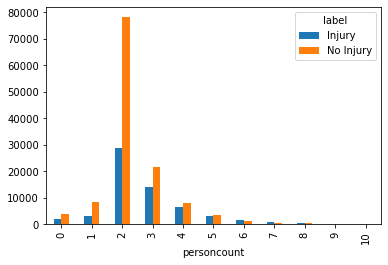

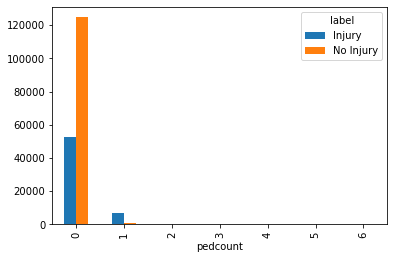

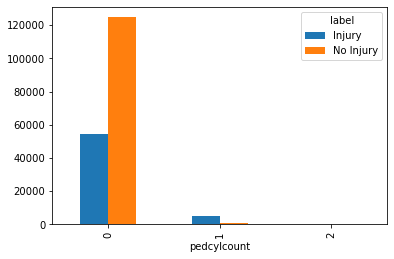

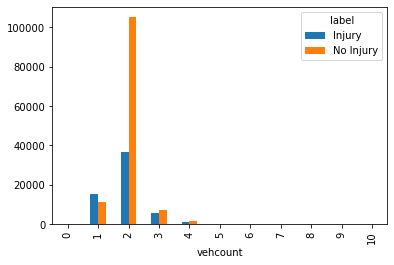

In [25]:
for col in df.select_dtypes(exclude = 'object').columns.values:
    df[df[col] <= 10]\
        .groupby(["label", df[col]])\
        .size()\
        .unstack('label', fill_value=0)\
        .plot(kind = "bar")


### Modeling Data <a name="model"></a>

As mentioned earlier, the independent variable is highly unbalanced and as such would cause a biased model depending on one's approach to this problem. There are several ways to remedy this situation, some examples are:

1. Up-sampling the minority class
2. Down-sampling the majority class
3. Create Synthetic Samples (Data Augmentation)
4. Penalize algorithms (cost-sensitive training)
5. Use tree-based algorithms
6. Change your performance metric

Up-sampling consists of randomly resampling the minority class duplicating some observations until the number each class has the same amount of data. Down-sampling works in the same away but instead, we randomly remove some observations from the majority class. The problem with this approach is that we either remove information from our data or duplicate rows exactly as they are, which is not the same as having more organic observations. A better away to up-sample our data would be acquiring more data, which may not be possible (as this problem shows), or be able to simulate data with similar, but not identical, characteristics of our minority class, that is the concept of Data Augmentation and what techniques such as SMOTE algorithm does.

Instead of worrying about how to properly resample the data one could just choose a better modeling technique, such as penalizing weights that increase the cost of classification mistakes on the minority class or use models with a hierarchical structure that allows them to learn signals from both classes such as CART models.
An easier approach still, would be to use a performance metric that is less affected by this unbalanced behavior such as the area under the ROC curve - AUCROC. This away we can easily compare different models build on top of the same unbalanced data.

For the purpose of this course, seeking to use most of the methods learned before, like Logistic Regression, I'll use a mix of the explained methods such as up-sampling, CART models, and different performance metrics.

#### Resample

In [13]:
# Separate majority and minority classes
df_majority = df[df.label == 'No Injury']
df_minority = df[df.label == 'Injury']
 
# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace = True,     # sample with replacement
                                 n_samples = len(df_majority.index), # to match majority class
                                 random_state = 123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
# Display new class counts
df_upsampled.label.value_counts()

Injury       125439
No Injury    125439
Name: label, dtype: int64

#### Data Split

In [14]:
target_var = "label"
categorical_vars = np.setdiff1d(df.select_dtypes(include = 'object').columns.values, [target_var])
numerical_vars = df.select_dtypes(exclude = 'object').columns.values

y = df_upsampled[target_var].values
df_dummies = pd.get_dummies(df_upsampled, columns=categorical_vars, drop_first=True).drop([target_var], axis = 1)
X = preprocessing.StandardScaler().fit(df_dummies).transform(df_dummies)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)

#### Logistic Regression

In [15]:
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)

yhat_logit = LR.predict(X_test)
yhat_logit_prob = LR.predict_proba(X_test)

print ("Metrics Report:\n", metrics.classification_report(y_test, yhat_logit))

Metrics Report:
               precision    recall  f1-score   support

      Injury       0.68      0.80      0.73     24858
   No Injury       0.76      0.63      0.69     25318

    accuracy                           0.71     50176
   macro avg       0.72      0.71      0.71     50176
weighted avg       0.72      0.71      0.71     50176



#### Decision Tree

In [16]:
dTree = tree.DecisionTreeClassifier(criterion="entropy", max_depth = 5)
dTree.fit(X_train,y_train)

yhat_dtree = dTree.predict(X_test)
yhat_dtree_prob = dTree.predict_proba(X_test)
print ("Metrics Report:\n", metrics.classification_report(y_test, yhat_dtree))

Metrics Report:
               precision    recall  f1-score   support

      Injury       0.74      0.57      0.64     24858
   No Injury       0.65      0.80      0.72     25318

    accuracy                           0.69     50176
   macro avg       0.70      0.68      0.68     50176
weighted avg       0.69      0.69      0.68     50176



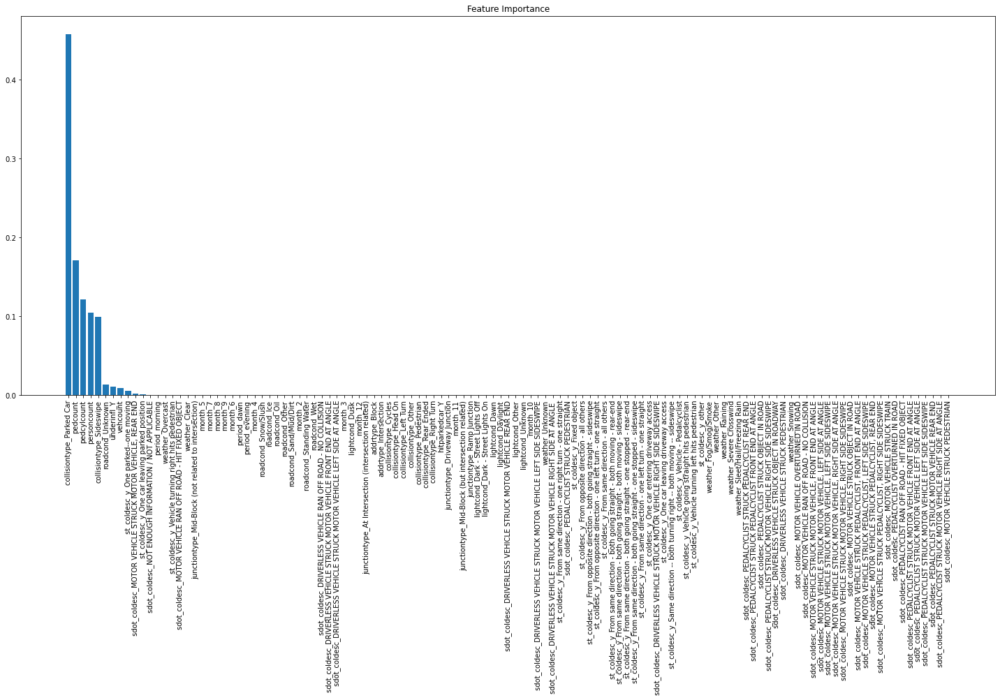

In [19]:
dtree_importances = dTree.feature_importances_
plot_feat_imp(dtree_importances, X)

[Text(713.9504716981132, 498.3, 'collisiontype_Parked Car <= 0.816\nentropy = 1.0\nsamples = 200702\nvalue = [100581, 100121]\nclass = Injury'),
 Text(381.6509433962264, 407.70000000000005, 'pedcount <= 1.657\nentropy = 0.979\nsamples = 163926\nvalue = [95912, 68014]\nclass = Injury'),
 Text(210.56603773584905, 317.1, 'pedcylcount <= 2.121\nentropy = 0.992\nsamples = 151368\nvalue = [83865, 67503]\nclass = Injury'),
 Text(105.28301886792453, 226.5, 'collisiontype_Sideswipe <= 1.503\nentropy = 0.998\nsamples = 142193\nvalue = [75218, 66975]\nclass = Injury'),
 Text(52.64150943396226, 135.89999999999998, 'personcount <= -0.031\nentropy = 0.987\nsamples = 125459\nvalue = [70997, 54462]\nclass = Injury'),
 Text(26.32075471698113, 45.299999999999955, 'entropy = 1.0\nsamples = 71993\nvalue = [35850, 36143]\nclass = No Injury'),
 Text(78.9622641509434, 45.299999999999955, 'entropy = 0.927\nsamples = 53466\nvalue = [35147, 18319]\nclass = Injury'),
 Text(157.9245283018868, 135.89999999999998, 

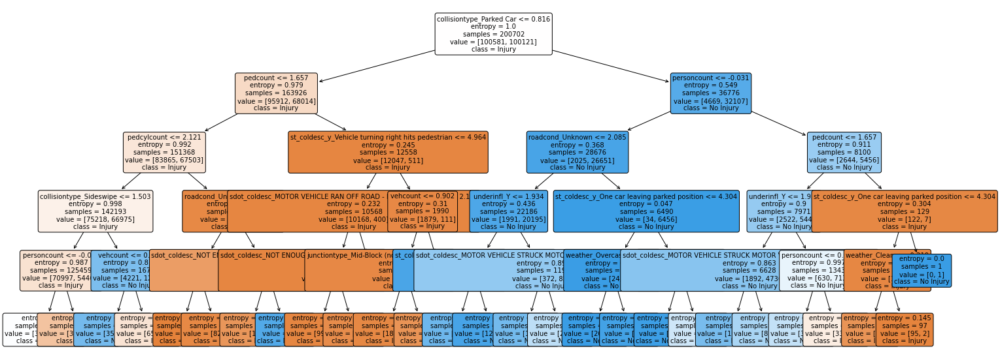

In [50]:
plt.figure(figsize=(25,10))
plot_tree(dTree, 
              feature_names=df_dummies.columns.values, 
              class_names=np.unique(y), 
              filled=True, 
              rounded=True, 
              fontsize=10)

#### Random Forest

In [17]:
# Train model
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
 
yhat_rf = rf.predict(X_test)
yhat_rf_prob = rf.predict_proba(X_test)

print ("Metrics Report:\n", metrics.classification_report(y_test, yhat_rf))

Metrics Report:
               precision    recall  f1-score   support

      Injury       0.73      0.85      0.79     24858
   No Injury       0.82      0.70      0.75     25318

    accuracy                           0.77     50176
   macro avg       0.78      0.77      0.77     50176
weighted avg       0.78      0.77      0.77     50176



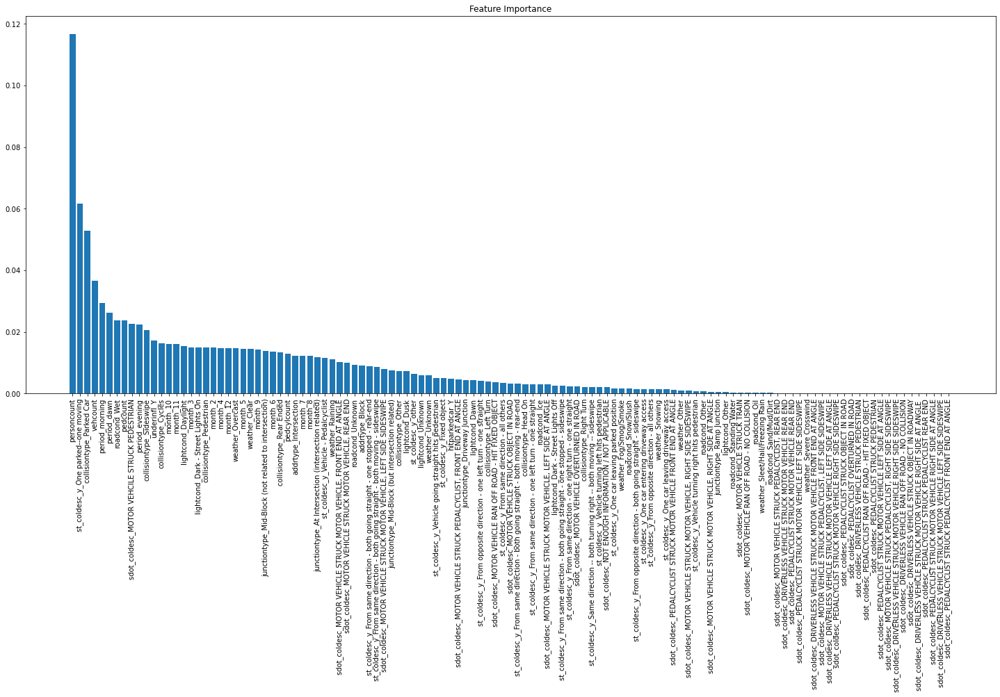

In [21]:
rf_importances = rf.feature_importances_
plot_feat_imp(rf_importances, X)

#### XGBoost


In [18]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)

yhat_xgb = xgb.predict(X_test)
yhat_xgb_prob = xgb.predict_proba(X_test)

print ("Metrics Report:\n", metrics.classification_report(y_test, yhat_xgb))

Metrics Report:
               precision    recall  f1-score   support

      Injury       0.69      0.81      0.74     24858
   No Injury       0.77      0.64      0.70     25318

    accuracy                           0.72     50176
   macro avg       0.73      0.72      0.72     50176
weighted avg       0.73      0.72      0.72     50176



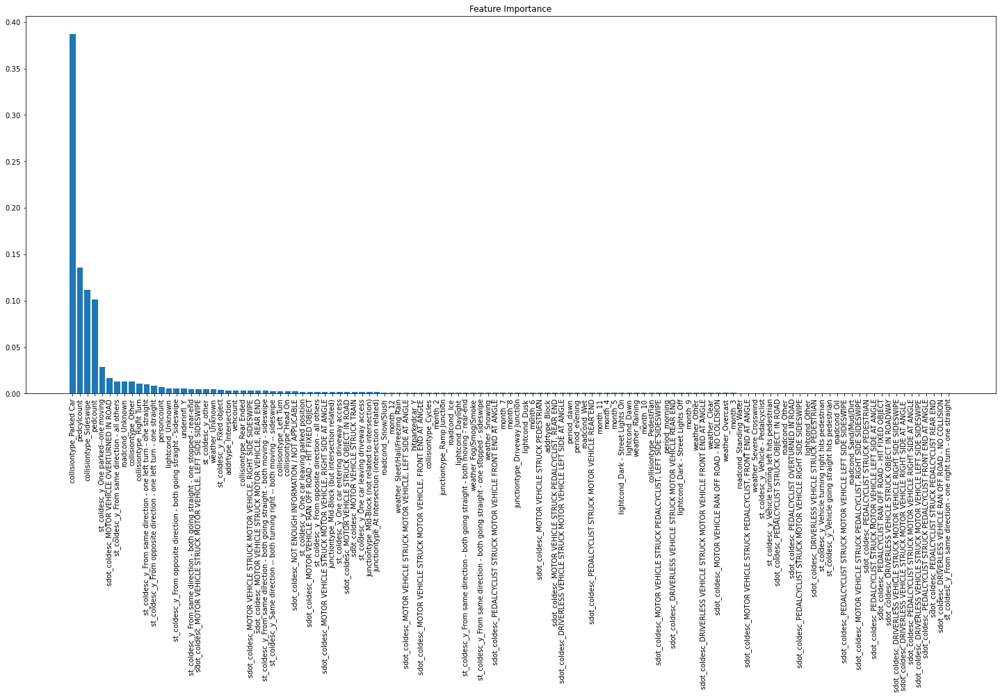

In [23]:
xgb_importances = xgb.feature_importances_
plot_feat_imp(xgb_importances, X)

#### Overall Comparison

In [19]:
dt_metrics = pd.DataFrame(np.array([["LogisticRegression",
                                     metrics.accuracy_score(y_test, yhat_logit), 
                                     metrics.jaccard_score(y_test, yhat_logit, pos_label = "Injury"),
                                     metrics.f1_score(y_test, yhat_logit, average='weighted'),
                                     metrics.log_loss(y_test, yhat_logit_prob),
                                     metrics.roc_auc_score(y_test, [p[1] for p in yhat_logit_prob])],
                                    ["Decision Tree",
                                     metrics.accuracy_score(y_test, yhat_dtree), 
                                     metrics.jaccard_score(y_test, yhat_dtree, pos_label = "Injury"),
                                     metrics.f1_score(y_test, yhat_dtree, average='weighted'),
                                     metrics.log_loss(y_test, yhat_dtree_prob),
                                     metrics.roc_auc_score(y_test, [p[1] for p in yhat_dtree_prob])],
                                    ["Random Forest",
                                     metrics.accuracy_score(y_test, yhat_rf), 
                                     metrics.jaccard_score(y_test, yhat_rf, pos_label = "Injury"),
                                     metrics.f1_score(y_test, yhat_rf, average='weighted'),
                                     metrics.log_loss(y_test, yhat_rf_prob),
                                     metrics.roc_auc_score(y_test, [p[1] for p in yhat_rf_prob])],
                                    ["XGBoost",
                                     metrics.accuracy_score(y_test, yhat_xgb), 
                                     metrics.jaccard_score(y_test, yhat_xgb, pos_label = "Injury"),
                                     metrics.f1_score(y_test, yhat_xgb, average='weighted'),
                                     metrics.log_loss(y_test, yhat_xgb_prob),
                                     metrics.roc_auc_score(y_test, [p[1] for p in yhat_xgb_prob])]
                                    ]),
                          columns = ["Algorithm", "Accuracy", "Jaccard", "F1-Score", "LogLoss", "ROC"])
dt_metrics

,Algorithm,Accuracy,Jaccard,F1-Score,LogLoss,ROC
0,LogisticRegression,0.7121332908163265,0.5790148644709997,0.7100804132572037,0.531281554132361,0.798458537803834
1,Decision Tree,0.6851084183673469,0.470722229666354,0.6804767222615782,0.5434348562848158,0.7737226504925415
2,Random Forest,0.7704280931122449,0.6463526955667445,0.7691928785524075,0.6434953446164758,0.8601074873112441
3,XGBoost,0.7234933035714286,0.59209713932908,0.7215439658356644,0.5147106399491282,0.8116496637308793


## Results <a name="results"></a>

The analyses show that it is possible to make a machine learning model that predicts, with a certain level of precision, the probability of an accident having at least one person injured. To accomplish such a goal it is needed to work hard to collect the data and even harder to treat the dataset afterward as it is almost certain that the observations will have some problems. It is best to have knowledge in the field or at least access to a business expert to explain to you about the particularities of the problem to extract better insights from the data. 

## Discussion <a name="discussion"></a>

As the descriptive analyses showed before, regarding location and collision type being some attributes that, alongside with the number of people involved in an accident, expose a difference among the ratio between accidents with and without an injure. 

This assumption is validated by the feature importance of the models confirming that these variables play a huge part in defining the probability of an accident ending up with at least one person injured in a way that accidents with pedestrians or cyclists and at intersections where the driver is under influence of alcohol or drugs are more likely to have an injured person.

## Conclusion <a name="conclusion"></a>

There are a lot of different algorithms around for classification, clustering, time-series forecast, regression, and other types of problems. What this challenge shows is that Data Scientists, more than the theoretical knowledge of how these algorithms work, they must always keep in mind that some techniques are better suited to specific cases, such as unbalanced dependent variable and adjust the analyses and the model to accommodate these specificities, keeping a curious mind to search and research about different applications and situations. 